# Programming For Data Science Summative 1 #
## Social Network Analysis of Yellow Cab Journeys in NYC ##

In [1]:
# import image module - imported earlier than standard so image could be shown at the top of the notebook
from IPython.display import Image

# display image
Image(url="https://publish.purewow.net/wp-content/uploads/sites/2/2018/05/nyc-yellow-taxi-in-times-square-hero.jpg",
      width=1026, height=568)

Add caption/reference

## Installing and Importing Libraries ##

In [2]:
# Importing libraries that are needed for this Social Network Analysis
import geopandas as gpd
import matplotlib.colors as mcolors
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import pyarrow.parquet as pq
import requests
import scipy as sp
import seaborn as sns
from shapely.geometry import Polygon, MultiPolygon

## Chapter 1: Introduction ##

To add

## Chapter 2: Importing Data ##

In [3]:
# Load Taxi journey data
trips_url = "https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2025-10.parquet"

try:
    all_trips = pd.read_parquet(trips_url)
except HTTPError as e:
    print(f"HTTP error: {e}")
except ConnectionError:
    print("Network connection error")
except SSLError:
    print("SSL certificate error")
except pyarrow.lib.ArrowInvalid:
    print("Downloaded file is not valid Parquet")
except Exception as e:
    print(f"Unexpected error: {e}")

# Print first 5 rows of dataframe
all_trips.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,cbd_congestion_fee
0,1,2025-10-01 00:15:32,2025-10-01 01:04:03,1.0,17.20,2.0,N,132,107,1,70.0,5.00,0.5,0.00,6.94,1.0,83.44,2.5,1.75,0.75
1,7,2025-10-01 00:00:08,2025-10-01 00:00:08,1.0,5.00,1.0,N,107,225,1,28.2,0.00,0.5,8.49,0.00,1.0,42.44,2.5,0.00,0.75
2,2,2025-10-01 00:08:54,2025-10-01 00:14:44,1.0,2.75,1.0,N,263,229,1,12.8,1.00,0.5,3.71,0.00,1.0,22.26,2.5,0.00,0.75
3,1,2025-10-01 00:58:48,2025-10-01 01:04:40,1.0,1.30,1.0,N,211,231,2,7.9,4.25,0.5,0.00,0.00,1.0,13.65,2.5,0.00,0.75
4,2,2025-10-01 00:39:51,2025-10-01 00:49:40,1.0,2.88,1.0,N,230,151,1,14.2,1.00,0.5,3.99,0.00,1.0,23.94,2.5,0.00,0.75


In [4]:
# Load NYC taxi zone data

try:
    zones_path = "NYC_Taxi_Zones.geojson" 
    zones = gpd.read_file(zones_path)
except FileNotFoundError:
    print("Zones file not found, download at:" \
    "https://data.cityofnewyork.us/Transportation/NYC-Taxi-Zones/8meu-9t5y/data_preview")
except PermissionError:
    print("Permission denied when accessing zones file")
except DriverError:
    print("File exists but is not a valid geospatial format")
except JSONDecodeError:
    print("GeoJSON file is not valid JSON")
except UnicodeDecodeError:
    print("Encoding error while reading zones file")
except OSError as e:
    print(f"OS error: {e}")
except Exception as e:
    print(f"Unexpected error: {e}")

# Print first 5 rows of dataframe
zones.head()

,shape_area,objectid,shape_leng,location_id,zone,borough,geometry
0,0.0007823067885,1,0.116357453189,1,Newark Airport,EWR,"MULTIPOLYGON (((-74.18445 40.695, -74.18449 40..."
1,0.00486634037837,2,0.43346966679,2,Jamaica Bay,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,0.000314414156821,3,0.0843411059012,3,Allerton/Pelham Gardens,Bronx,"MULTIPOLYGON (((-73.84793 40.87134, -73.84725 ..."
3,0.000111871946192,4,0.0435665270921,4,Alphabet City,Manhattan,"MULTIPOLYGON (((-73.97177 40.72582, -73.97179 ..."
4,0.000497957489363,5,0.0921464898574,5,Arden Heights,Staten Island,"MULTIPOLYGON (((-74.17422 40.56257, -74.17349 ..."


## Chapter 3: Initial Data Cleaning and Manipulation ## 

### all_trips Dataframe ###

In [5]:
# Understand the shape of the all_trips dataframe prior to manipulation
all_trips.shape

(4428699, 20)

In [6]:
# Drop unnecessary columns from all_trips
all_trips.drop(columns = ['VendorID', 'passenger_count', 'RatecodeID',
                          'store_and_fwd_flag', 'payment_type', 'fare_amount', 
                          'extra', 'mta_tax', 'tip_amount', 'tolls_amount', 
                          'improvement_surcharge', 'congestion_surcharge', 
                          'Airport_fee', 'cbd_congestion_fee'], inplace = True)
all_trips.head()

,tpep_pickup_datetime,tpep_dropoff_datetime,trip_distance,PULocationID,DOLocationID,total_amount
0,2025-10-01 00:15:32,2025-10-01 01:04:03,17.20,132,107,83.44
1,2025-10-01 00:00:08,2025-10-01 00:00:08,5.00,107,225,42.44
2,2025-10-01 00:08:54,2025-10-01 00:14:44,2.75,263,229,22.26
3,2025-10-01 00:58:48,2025-10-01 01:04:40,1.30,211,231,13.65
4,2025-10-01 00:39:51,2025-10-01 00:49:40,2.88,230,151,23.94


In [7]:
# Validate that the datatypes of all_trips are correct
all_trips.dtypes

tpep_pickup_datetime     datetime64[us]
tpep_dropoff_datetime    datetime64[us]
trip_distance                   float64
PULocationID                      int32
DOLocationID                      int32
total_amount                    float64
dtype: object

In [8]:
# Determine invalid trips where the drop off occurred before the pick up
mask = all_trips["tpep_dropoff_datetime"] < all_trips["tpep_pickup_datetime"]

# Print number of valid and invalid trips
print(mask.value_counts())

# Remove invlaid rows
all_trips = all_trips[~mask]

# Check correct number of rows have been removed
all_trips.shape

False    4428697
True           2
Name: count, dtype: int64


(4428697, 6)

In [ ]:
# Determine the duration of each trip and add it to a new column in the dataframe
all_trips['Duration'] = all_trips["tpep_dropoff_datetime"] - all_trips["tpep_pickup_datetime"]

# Calculating the interquartile range and the upper and lower bound for the duration
Q1 = all_trips["Duration"].quantile(0.25)
Q3 = all_trips["Duration"].quantile(0.75)
IQR = Q3 - Q1
upper_bound = pd.Timedelta(Q3 + 1.5 * IQR)
lower_bound = pd.Timedelta(Q1 - 1.5 * IQR)
print("Trip Duration upper bound is:", upper_bound, "and the lower bound is", lower_bound)

# Calculating the number of trips outside of the upper and lower bounds
mask = (all_trips['Duration'] < lower_bound) | (all_trips['Duration'] > upper_bound)
print(mask.value_counts())

# Removing outlier rows
all_trips = all_trips[~mask]

# Validating the new shape of the dataframe
all_trips.shape

/var/folders/5d/_70z8cj573dcc1vb6ywm64fh0000gn/T/ipykernel_43972/2725871225.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_trips['Duration'] = all_trips["tpep_dropoff_datetime"] - all_trips["tpep_pickup_datetime"]


Trip Duration upper bound is: 0 days 00:39:45 and the lower bound is -1 days +23:49:21
Duration
False    4084061
True       21851
Name: count, dtype: int64


(4084061, 7)

In [ ]:
# Calculating the upper and lower bound for the cost of the trip
Q1 = all_trips["total_amount"].quantile(0.25)
Q3 = all_trips["total_amount"].quantile(0.75)
IQR = Q3 - Q1
upper_bound = Q3 + 1.5 * IQR
lower_bound = Q1 - 1.5 * IQR
print("Trip Total Amount upper bound is:", upper_bound, "and the lower bound is", lower_bound)

# Finding rows were the cost is considered an outlier
mask = (all_trips['total_amount'] < 0) | (all_trips['total_amount'] > upper_bound)
print(mask.value_counts())

# Removing outlier rows
all_trips = all_trips[~mask]

# Printing the new shape of the dataframe
all_trips.shape

Trip Total Amount upper bound is: 48.480000000000004 and the lower bound is -4.800000000000001
total_amount
False    3745888
True      338173
Name: count, dtype: int64


(3745888, 7)

In [ ]:
# Checking for null values
all_trips.isnull().any().sum()

0

In [ ]:
# Checking for duplicated rows
all_trips.duplicated(subset=None).any().sum()

0

In [ ]:
# Ensure Location IDs are integers and drop missing rows
for col in ["PULocationID", "DOLocationID"]:
    if col not in all_trips.columns:
        raise ValueError(f"Missing column '{col}' in trips file {trips_path}")
all_trips = all_trips.dropna(subset=["PULocationID", "DOLocationID"]).copy()
all_trips["PULocationID"] = all_trips["PULocationID"].astype(int)
all_trips["DOLocationID"] = all_trips["DOLocationID"].astype(int)

In [ ]:
# Print final shape of the clean all_trips dataframe
all_trips.shape

(3796166, 7)

### zones dataframe ###

In [ ]:
# Reminder of the zones dataframe
zones.head()

,shape_area,objectid,shape_leng,location_id,zone,borough,geometry
0,0.0007823067885,1,0.116357453189,1,Newark Airport,EWR,"MULTIPOLYGON (((-74.18445 40.695, -74.18449 40..."
1,0.00486634037837,2,0.43346966679,2,Jamaica Bay,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,0.000314414156821,3,0.0843411059012,3,Allerton/Pelham Gardens,Bronx,"MULTIPOLYGON (((-73.84793 40.87134, -73.84725 ..."
3,0.000111871946192,4,0.0435665270921,4,Alphabet City,Manhattan,"MULTIPOLYGON (((-73.97177 40.72582, -73.97179 ..."
4,0.000497957489363,5,0.0921464898574,5,Arden Heights,Staten Island,"MULTIPOLYGON (((-74.17422 40.56257, -74.17349 ..."


In [ ]:
# Checking for null values in the dataframe
zones.isnull().any().sum()

0

In [ ]:
# Checking the datatypes of the zones dataframe
zones.dtypes

shape_area       object
objectid         object
shape_leng       object
location_id      object
zone             object
borough          object
geometry       geometry
dtype: object

In [ ]:
# Creating a dictionary of the correct datatypes
convert_dict = {'shape_area': np.float64, 'objectid': int, 'shape_leng': np.float64, 'location_id':int}

# Reassigning types and validating
zones = zones.astype(convert_dict)
print(zones.dtypes)

shape_area      float64
objectid          int64
shape_leng      float64
location_id       int64
zone             object
borough          object
geometry       geometry
dtype: object


### Cleaning both dataframes together ###

In [ ]:
# Checking that each pick up and drop off location can be found within the zones dataframe
valid_ids = set(zones["objectid"]) 
all_trips = all_trips[all_trips["PULocationID"].isin(valid_ids) & all_trips["DOLocationID"].isin(valid_ids) ]

In [ ]:
# Printing the final dimensions of each dataframe
print("Taxi Trips Cleaned, new size (rows, columns):", all_trips.shape) 
print("Taxi Zones Cleaned, new size (rows, columns):", zones.shape)

Taxi Trips Cleaned, new size (rows, columns): (3782204, 7)
Taxi Zones Cleaned, new size (rows, columns): (263, 7)


## Chapter 4: Initial Visualisations ##

[Check] G nodes: 258 | Zone nodes: 260 | Overlap: 256
[Subgraph] 256 nodes / 28549 edges


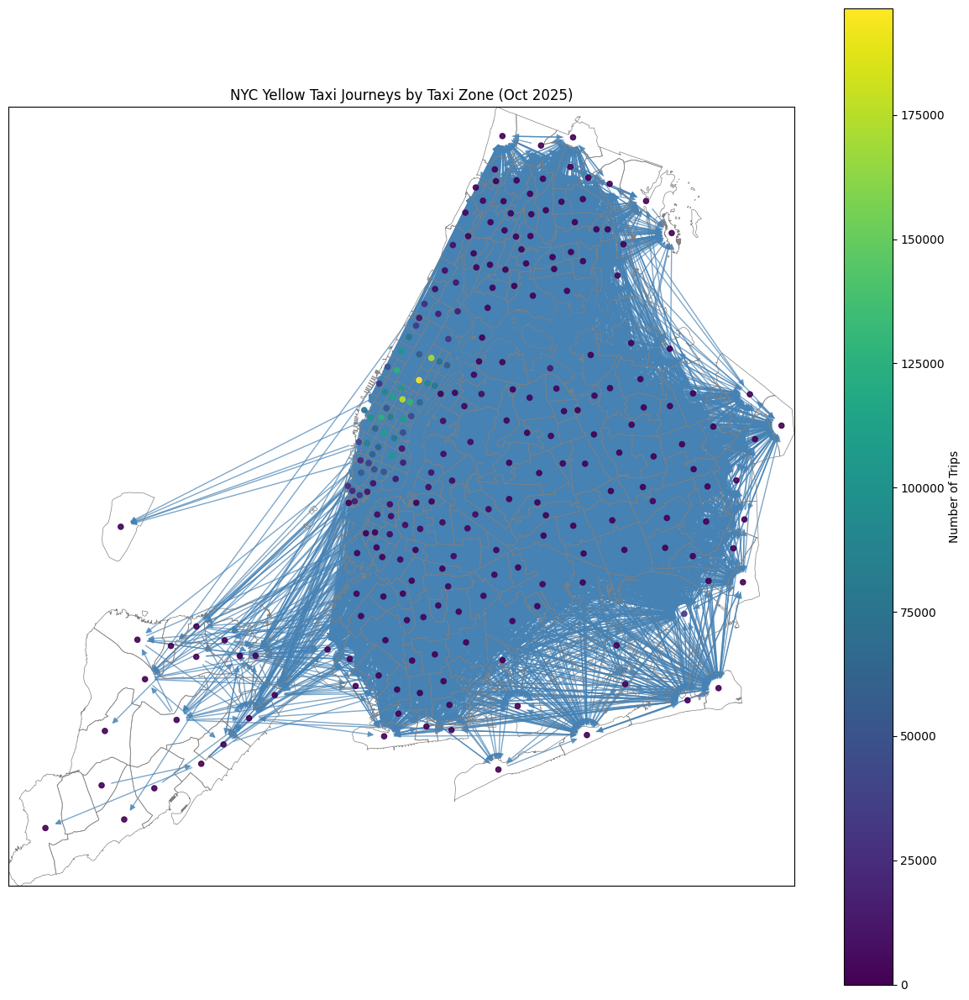

In [ ]:
# Initialise networkX graph
G = nx.DiGraph()

# Calculate the number of identical routes by zone
edge_counts = (
    all_trips.groupby(["PULocationID", "DOLocationID"])
             .size()
             .reset_index(name="weight")
)

# Remove self-loops 
edge_counts = edge_counts[edge_counts["PULocationID"] != edge_counts["DOLocationID"]]

# Add edges to graph
for _, row in edge_counts.iterrows():
    G.add_edge(int(row["PULocationID"]), int(row["DOLocationID"]), weight=int(row["weight"]))

# Set the ID column
id_col = "location_id"

# Project zones to correct dimensions
zones = zones.to_crs(epsg=2263)

# Clean ID column
zones = zones.dropna(subset=[id_col]).copy()
zones[id_col] = zones[id_col].astype(int)

# Set the centre of each zone
zones["center"] = zones.geometry.representative_point()

# Caluculate the intersection between graph and zones
graph_nodes = set(G.nodes())
zone_nodes = set(zones[id_col].unique())
intersection = graph_nodes & zone_nodes

# Build subgraph using only intersecting nodes
G_zones = G.subgraph(intersection).copy()
print(f"Graph contains {G_zones.number_of_nodes()} nodes and {G_zones.number_of_edges()} edges")

# Build pos for nodes in the graph
zones_graph = zones[zones[id_col].isin(G_zones.nodes())]

pos = {
    int(r[id_col]): (r["center"].x, r["center"].y)
    for _, r in zones_graph.iterrows()
}


# Calculate trip counts which will colour the nodes
trip_counts_per_zone = (
    all_trips.groupby("PULocationID")
             .size()
             .reindex(G_zones.nodes(), fill_value=0)
)


# Initialise Plot
fig, ax = plt.subplots(figsize=(12, 12))

# Draw zone boundaries
zones.boundary.plot(ax=ax, color="gray", linewidth=0.5)

# Set graph size
xmin, ymin, xmax, ymax = zones.total_bounds
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.set_aspect("equal")

# Draw edges
nx.draw_networkx_edges(
    G_zones,
    pos,
    ax=ax,
    edge_color="steelblue",
    alpha=0.7
)

# Draw nodes
nx.draw_networkx_nodes(
    G_zones,
    pos,
    ax=ax,
    node_size=20,
    node_color=trip_counts_per_zone,
    cmap="viridis",
    alpha=0.9
)

# Colorbar
sm = plt.cm.ScalarMappable(
    cmap="viridis",
    norm=plt.Normalize(
        vmin=trip_counts_per_zone.min(),
        vmax=trip_counts_per_zone.max()
    )
)
sm.set_array([])
plt.colorbar(sm, ax=ax, label="Number of Trips")

# Display graph
plt.title("NYC Yellow Taxi Journeys by Taxi Zone (Oct 2025)")
plt.tight_layout()
plt.show()

In [ ]:
# Calculate whether graph is connected
if not nx.is_connected(G_zones.to_undirected()):
    largest_cc = max(nx.connected_components(G_zones.to_undirected()), key=len)
    H = G_zones.subgraph(largest_cc).copy()
    print("Graph is not strongly connected, distance measures taken from the largest collection of connected components")
else:
    H = G_zones

# Print Distance Measures Calculations
print("\033[1m\033[4mDistance Measures For The Whole Graph\033[0m")
print("Average Clustering:", nx.average_clustering(H))
print("Transitivity:", nx.transitivity(H))
avg_degree = sum(dict(H.degree()).values()) / H.number_of_nodes()
print("Average Degree:", avg_degree)
print("Average Shortest Path Length:", nx.average_shortest_path_length(H.to_undirected()))
print("Diameter:", nx.diameter(H.to_undirected()))
print("Radius:", nx.radius(H.to_undirected()))
print("There are", len(nx.periphery(H.to_undirected())), "Periphery Nodes.")
print("There are", len(nx.center(H.to_undirected())), "Center Nodes.")

Distance Measures For The Whole Graph
Average Clustering: 0.7125473818046639
Transitivity: 0.6752509109756863
Average Degree: 223.0390625
Average Shortest Path Length: 1.5217524509803921
Diameter: 4
Radius: 2
There are 96 Periphery Nodes.
There are 2 Center Nodes.


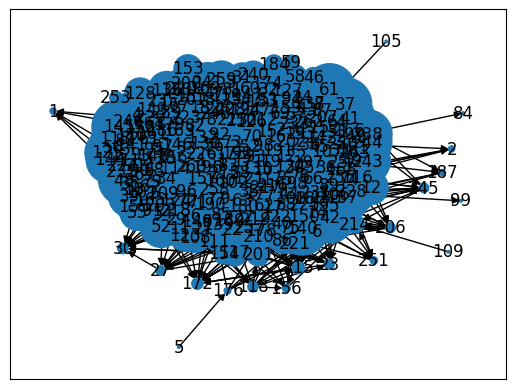

In [ ]:
# Display networkX graph in a kamada kawai layout based on degree centrality
pos = nx.kamada_kawai_layout(G)
size = [x*1000 for x in list (nx.degree_centrality(G).values())]
nx.draw_networkx(G, pos=pos, node_size=size)

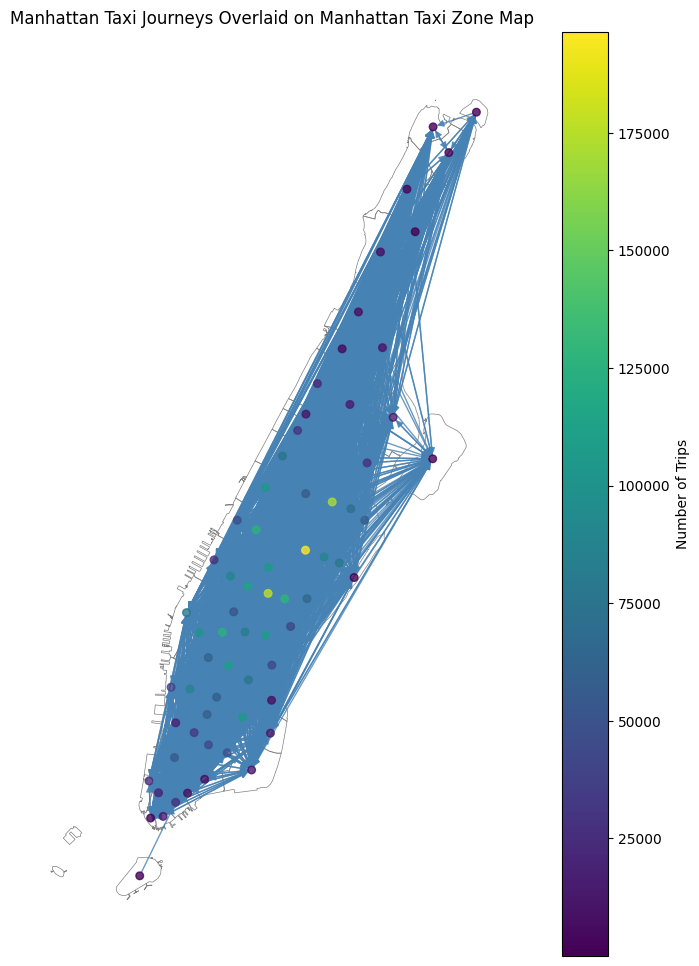

In [ ]:
# Filter to Manhattan only
Manhattan = zones[zones["borough"] == "Manhattan"].copy()

# Reproject (just in case)
Manhattan = Manhattan.to_crs(epsg=2263)

# Compute zone centers
Manhattan["center"] = Manhattan.geometry.centroid

# Build position dictionary for Manhattan
pos_man = {
    int(row["objectid"]): (row["center"].x, row["center"].y)
    for _, row in Manhattan.iterrows()
}

# Filter graph to Manhattan nodes only
G_Manhattan = G.subgraph(pos_man.keys()).copy()

# Set zone IDs for Manhattan and extract matching trips
manhattan_zone_ids = zones.loc[zones["borough"] == "Manhattan", "objectid"].tolist()
all_trips_manhattan = all_trips[
    all_trips["PULocationID"].isin(manhattan_zone_ids) |
    all_trips["DOLocationID"].isin(manhattan_zone_ids)
]

# Count the times each trip was taken
trip_counts_manhattan = (
    all_trips_manhattan
    .groupby("PULocationID")
    .size()
    .reindex(G_Manhattan.nodes(), fill_value=0)
)

# Initialise figure
fig, ax = plt.subplots(figsize=(12, 12))

# Draw map boundaries
Manhattan.plot(ax=ax, facecolor="none", edgecolor="gray", linewidth=0.5)

# Add in data
nx.draw(
    G_Manhattan,
    pos_man,
    ax=ax,
    node_size=30,
    node_color=trip_counts_manhattan,
    cmap = "viridis",
    edge_color="steelblue",
    #width=[G_Manhattan[u][v]["weight"] / 50 for u, v in G_Manhattan.edges()],
    arrows=True,
    alpha=0.8
)

# Set colour map
sm = plt.cm.ScalarMappable(cmap="viridis", 
                           norm=plt.Normalize(vmin=trip_counts_manhattan.min(), 
                                              vmax=trip_counts_manhattan.max()))
sm.set_array([])
plt.colorbar(sm, ax=ax, label="Number of Trips")

# Display graph
plt.title("Manhattan Taxi Journeys (October 2025)")
plt.show()


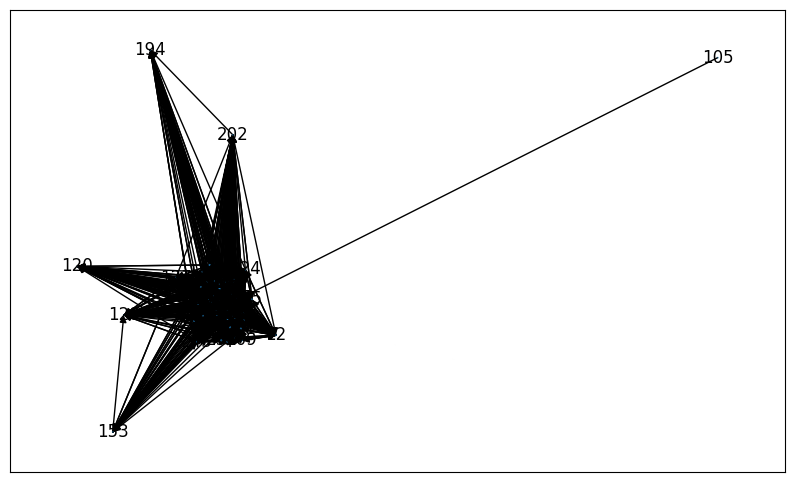

In [ ]:
# Display Manhattan data in a spring layout
pos = nx.spring_layout(G_Manhattan, k=0.25)
size = [x*20 for x in list (nx.pagerank(G_Manhattan).values())]

plt.figure(figsize=(10, 6))
nx.draw_networkx(G_Manhattan, pos=pos, node_size=size)
plt.show()

In [ ]:
# Understand whether graph for Manhattan is connected
if not nx.is_connected(G_Manhattan.to_undirected()):
    largest_cc = max(nx.connected_components(G_Manhattan.to_undirected()), key=len)
    H = G_Manhattan.subgraph(largest_cc).copy()
else:
    H = G_Manhattan

# Print Distance Measures for the borough
print("\033[1m\033[4mDistance Measures For Manhattan\033[0m")
print("Average Clustering:", nx.average_clustering(H))
print("Transitivity:", nx.transitivity(H))
avg_degree = sum(dict(H.degree()).values()) / H.number_of_nodes()
print("Average Degree:", avg_degree)
print("Average Shortest Path Length:", nx.average_shortest_path_length(H.to_undirected()))
print("Diameter:", nx.diameter(H.to_undirected()))
print("Radius:", nx.radius(H.to_undirected()))
print("There are", len(nx.periphery(H.to_undirected())), "Periphery Nodes.")
print("There are", len(nx.center(H.to_undirected())), "Center Nodes.")

Distance Measures For Manhattan
Average Clustering: 0.9521899043166351
Transitivity: 0.95652852602845
Average Degree: 120.83582089552239
Average Shortest Path Length: 1.0597014925373134
Diameter: 3
Radius: 2
There are 4 Periphery Nodes.
There are 63 Center Nodes.


## Chapter 5: Additional Data Manipulation and Cleaning ##

In [ ]:
# Calculate summary statisics for the number of times a trip is taken
route_counts = (all_trips.groupby(["PULocationID", "DOLocationID"]).size().reset_index(name="count")
)
route_counts["count"].describe()

count    28876.000000
mean       130.980884
std        626.699990
min          1.000000
25%          2.000000
50%          5.000000
75%         22.000000
max      29835.000000
Name: count, dtype: float64

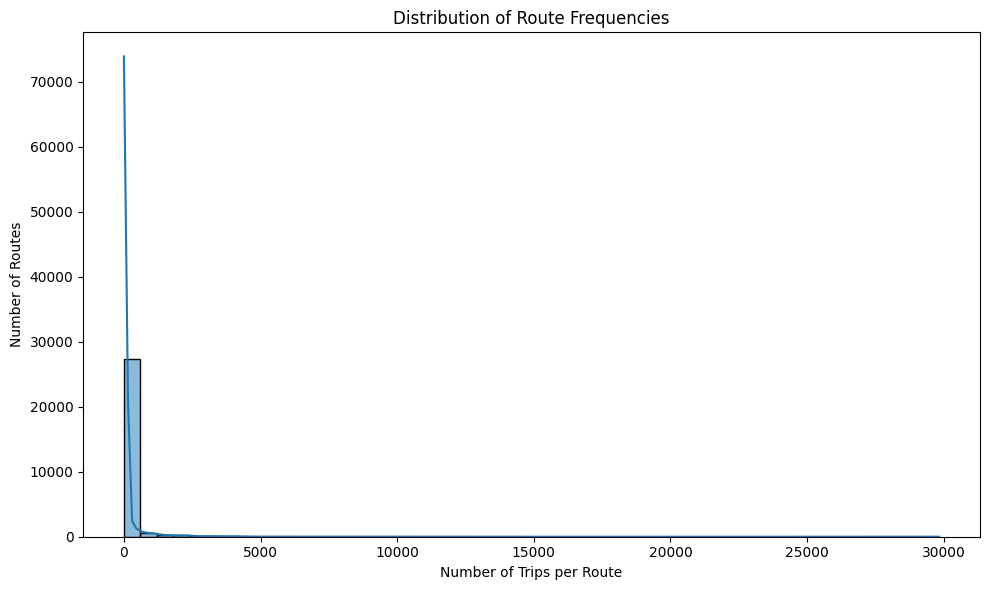

In [ ]:
# Plot the data above on a histogram
plt.figure(figsize=(10, 6))
sns.histplot(route_counts["count"], bins=50, kde=True)
plt.title("Distribution of Route Frequencies")
plt.xlabel("Number of Trips per Route")
plt.ylabel("Number of Routes")
plt.tight_layout()
plt.show()


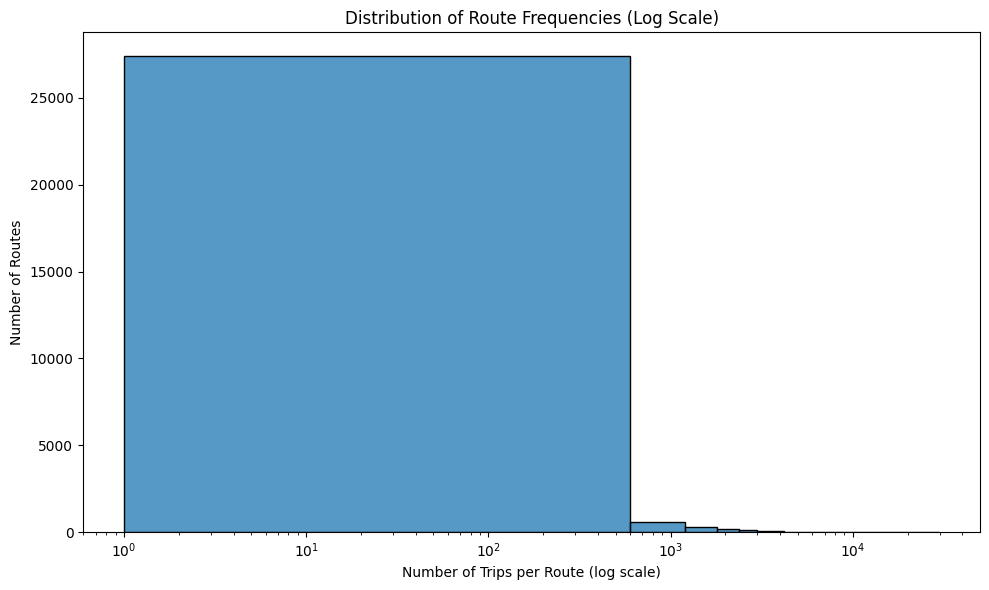

In [ ]:
# Rescale the number of trips logarithmically and plot new histogram
plt.figure(figsize=(10, 6))
sns.histplot(route_counts["count"], bins=50)
plt.xscale("log")

plt.title("Distribution of Route Frequencies (Log Scale)")
plt.xlabel("Number of Trips per Route (log scale)")
plt.ylabel("Number of Routes")
plt.tight_layout()
plt.show()


In [ ]:
# Explain why you will not be filtering the data further by no. of journeys

## Chapter 6: Centrality Measures ##

In [ ]:
def plot_centrality_measures(G, pos, borough_gdf):
    """
    Compute and plot several centrality measures on a GeoDataFrame background.
    
    Parameters
    ----------
    G : networkx.Graph
        The graph to analyze.
    pos : dict
        Node positions for plotting.
    borough_gdf : GeoDataFrame
        GeoDataFrame containing the borough boundary for background.
    """

    # Always safe centrality measures
    deg = nx.degree_centrality(G)
    close = nx.closeness_centrality(G)
    bet = nx.betweenness_centrality(G)
    eig = nx.eigenvector_centrality(G)
    pagerank = nx.pagerank(G)

    measures = [deg, close, bet, eig, pagerank]
    measure_names = [
        'Degree Centrality',
        'Closeness Centrality',
        'Betweenness Centrality',
        'Eigenvector Centrality',
        'PageRank',
    ]

    # Try eccentricity only if graph is connected
    try:
        if nx.is_connected(G.to_undirected()):
            ecc = nx.eccentricity(G)
            measures.append(ecc)
            measure_names.append('Eccentricity')
    except nx.NetworkXError:
        print("⚠️ Graph is not connected — skipping eccentricity.")


    # Plot each measure
    for name, measure in zip(measure_names, measures):

        fig, ax = plt.subplots(figsize=(10, 10))

        borough_gdf.plot(ax=ax, facecolor="none", edgecolor="gray", linewidth=0.5)

        # Set graph size to fill plot
        xmin, ymin, xmax, ymax = borough_gdf.total_bounds
        ax.set_xlim(xmin, xmax)
        ax.set_ylim(ymin, ymax)
        ax.set_aspect("equal")

        # Draw nodes and set colour 
        nodes = nx.draw_networkx_nodes(
            G,
            pos,
            ax=ax,
            node_color=list(measure.values()),
            nodelist=list(measure.keys()),
            cmap=plt.cm.spring
        )
        nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1, base=10))

        # Add edges to graph
        nx.draw_networkx_edges(G, pos, ax=ax, alpha=0.5)

        # Add labels to show the value of each zone
        nx.draw_networkx_labels(
            G,
            pos,
            labels={n: f"{v:.3f}" for n, v in measure.items()},
            font_size=6,
            ax=ax
        )

        # Setting titles and colour bars and displaying graph
        ax.set_title(name)
        plt.colorbar(nodes, ax=ax)

        ax.set_axis_off()
        plt.tight_layout()
        plt.show()

⚠️ Graph is not connected — skipping eccentricity.


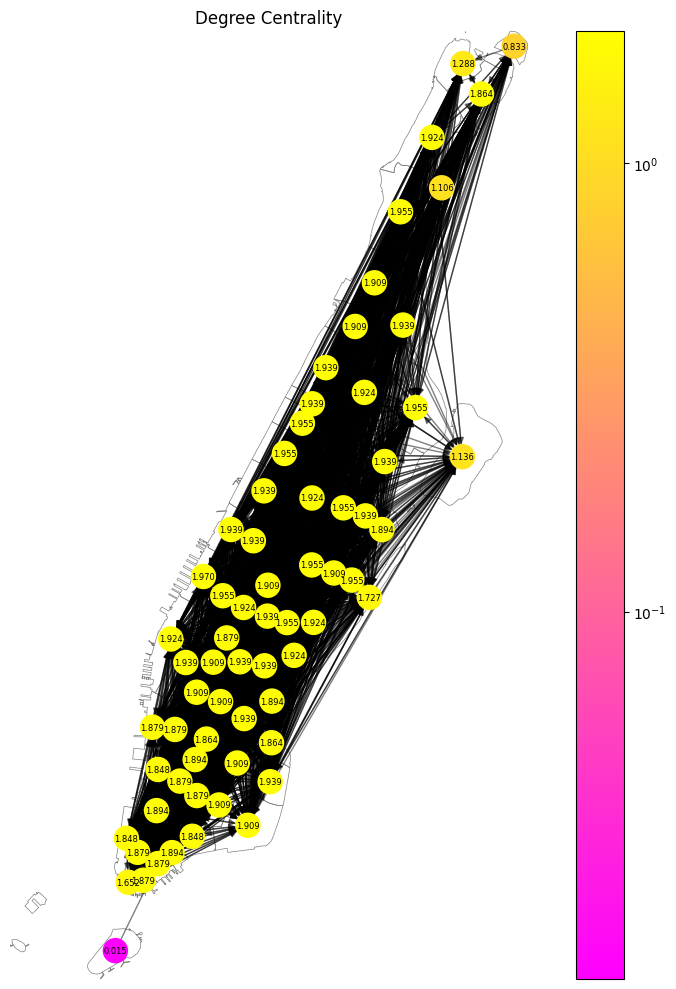

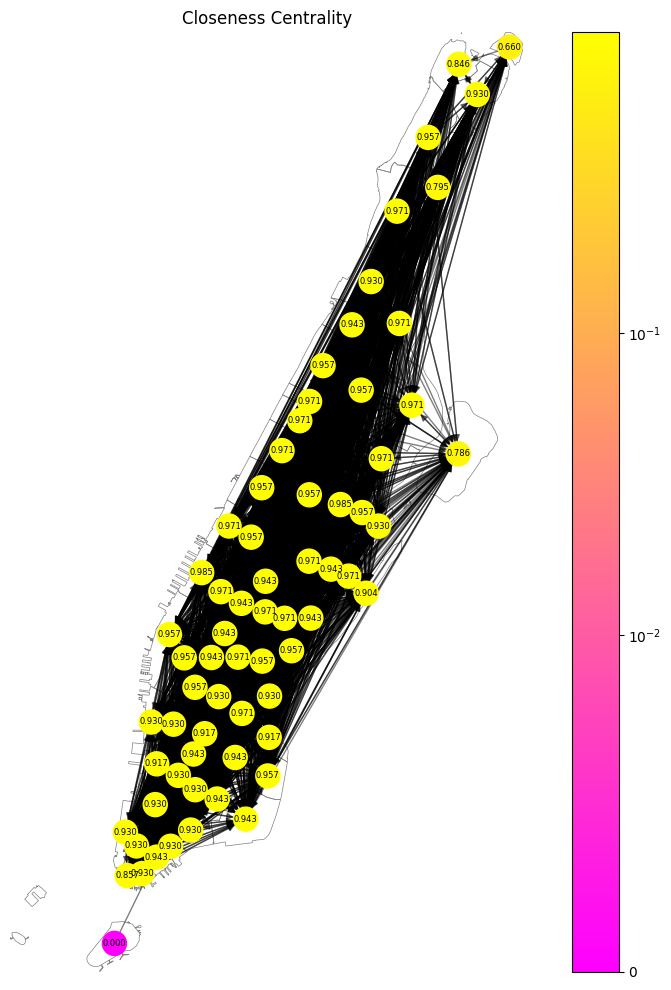

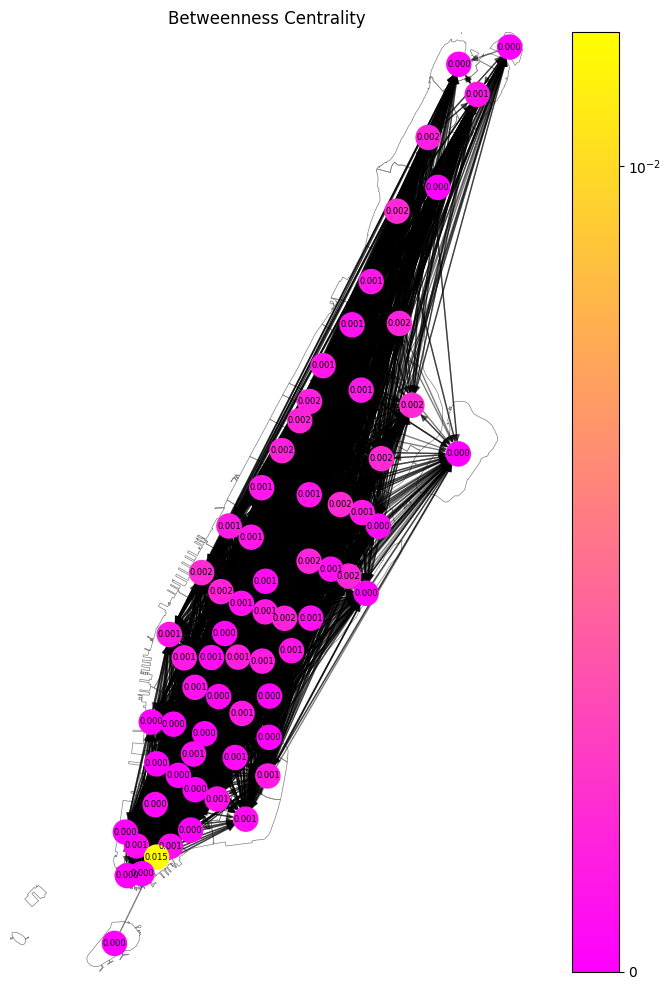

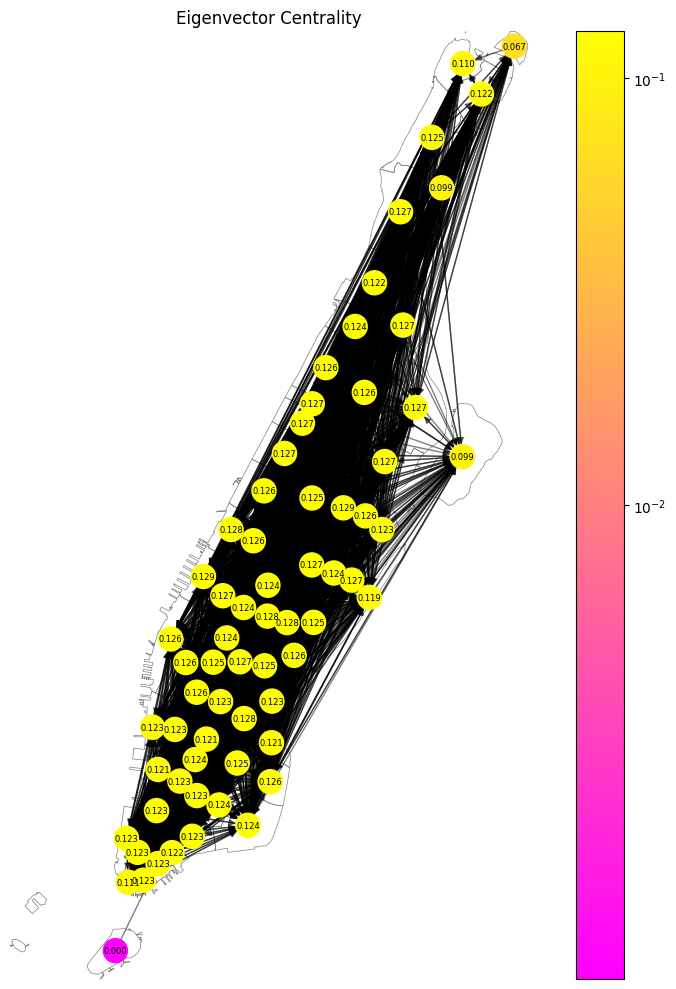

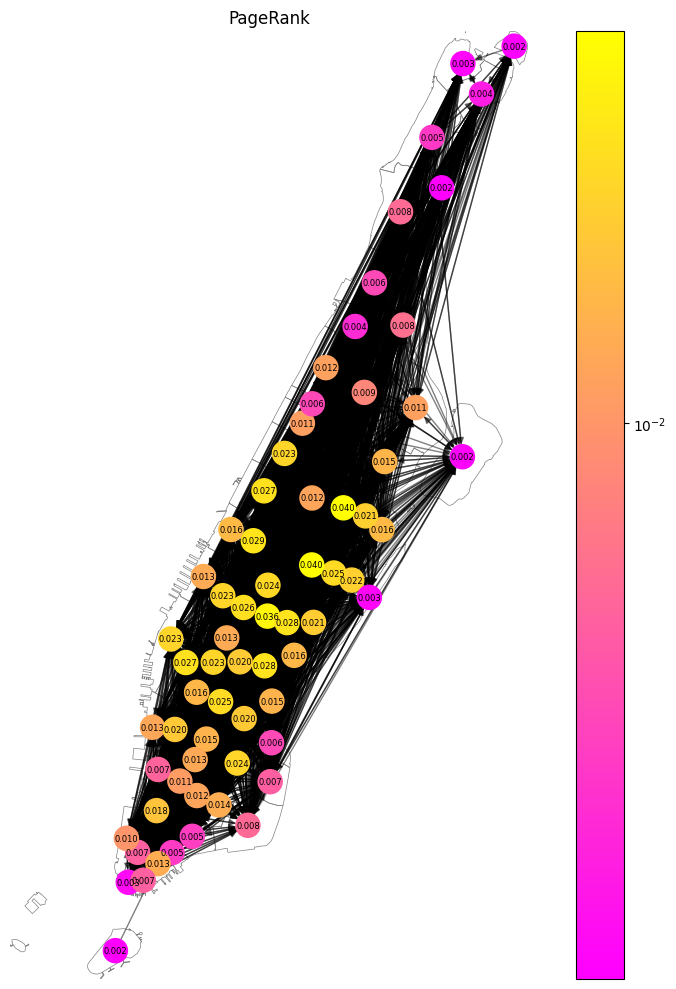

In [ ]:
# Running function defined above for Manhattan
plot_centrality_measures(G_Manhattan, pos_man, Manhattan)

Insert description of each chart and insights gained

## Chapter 7: Analysis ##

### Analysis 1: Most Common Journeys ###

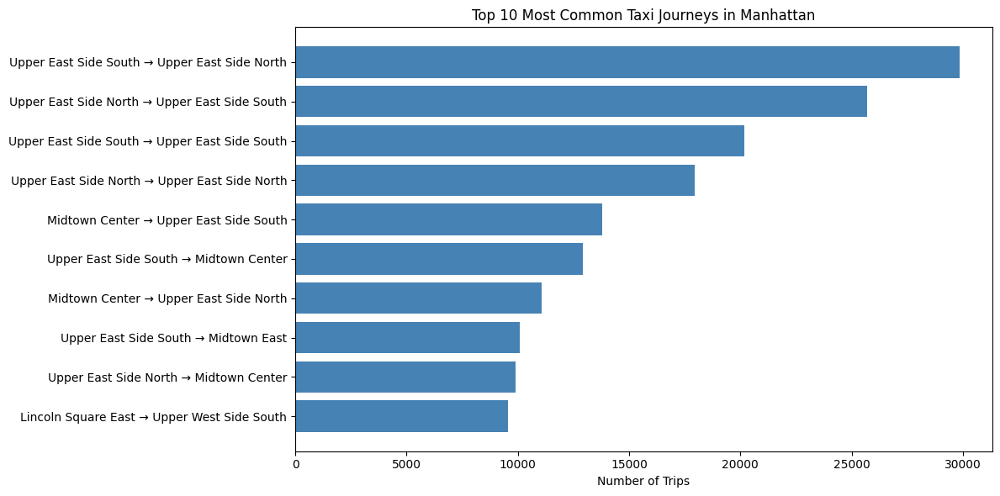

In [ ]:
# Calculating the top 10 trips in Manhattan
top10 = (
    all_trips_manhattan
    .groupby(["PULocationID", "DOLocationID"])
    .size()
    .reset_index(name="count")
    .sort_values("count", ascending=False)
    .head(10)
)

# Merge pickup names to actual names
top10 = top10.merge(
    zones[["objectid", "zone"]],
    left_on="PULocationID",
    right_on="objectid",
    how="left"
).rename(columns={"zone": "PU_name"}).drop(columns=["objectid"])

# Merge dropoff names to actual names
top10 = top10.merge(
    zones[["objectid", "zone"]],
    left_on="DOLocationID",
    right_on="objectid",
    how="left"
).rename(columns={"zone": "DO_name"}).drop(columns=["objectid"])

# Adding column to dataframe for the trip names
top10["journey"] = top10["PU_name"] + " → " + top10["DO_name"]

# Initialising figure
plt.figure(figsize=(12, 6))

# Creating a horizontal bar chart
plt.barh(
    y=top10["journey"],
    width=top10["count"],
    color="steelblue"
)

# Displaying graph
plt.xlabel("Number of Trips")
plt.title("Top 10 Most Common Taxi Journeys in Manhattan")
plt.gca().invert_yaxis()  # highest at top
plt.tight_layout()
plt.show()

### Analysis 2: Importance of node by hour ###


In [ ]:
# Setting up new columns needed for the dataframe
lookup_man = Manhattan.set_index("location_id")["objectid"].to_dict()

all_trips_manhattan["PU_obj"] = all_trips_manhattan["PULocationID"].map(lookup_man)
all_trips_manhattan["DO_obj"] = all_trips_manhattan["DOLocationID"].map(lookup_man)
all_trips_manhattan["hour"] = all_trips_manhattan["tpep_pickup_datetime"].dt.hour

# Creating empty dictionaires needed
hourly_graphs = {}
hourly_centrality_man = {}

# Cycle through each hour of the day and create a networkX graph for the trips taken based on Pagerank
for h in range(24):
    df_h = all_trips_manhattan[all_trips_manhattan["hour"] == h]

    G_h = nx.DiGraph()
    edges_h = (
        df_h.groupby(["PU_obj", "DO_obj"])
            .size()
            .reset_index(name="weight")
    )

    for _, row in edges_h.iterrows():
        s, d, w = int(row["PU_obj"]), int(row["DO_obj"]), int(row["weight"])
        if s != d:
            G_h.add_edge(s, d, weight=w)

    if len(G_h.nodes()) == 0:
        hourly_centrality_man[h] = {}
        continue

    hourly_graphs[h] = G_h
    hourly_centrality_man[h] = nx.pagerank(G_h)

# Create a list to store the shapes of Manhattan zones
manhattan_shapes = []

# Cycle through each row and add the geometry of the zone
for _, row in Manhattan.iterrows():
    geom = row.geometry

    # Handle Polygon and MultiPolygon correctly
    if isinstance(geom, Polygon):
        polys = [geom]
    elif isinstance(geom, MultiPolygon):
        polys = list(geom.geoms)
    else:
        continue

    # Convert each polygon to a Plotly scatter shape
    for poly in polys:
        x, y = poly.exterior.xy
        manhattan_shapes.append(
        go.Scatter(
            x=list(x),
            y=list(y),
            fill="toself",
            fillcolor="rgba(200,200,200,0.2)",
            line=dict(color="black", width=1),
            hoverinfo="skip",
            showlegend=False
        )
    )

# Build animation frames
obj_to_name = Manhattan.set_index("objectid")["zone"].to_dict()
frames = []

# Cycle through each hour and calculate the size and the colour of the nodes
for h in range(24):
    cent = hourly_centrality_man[h]

    sizes = [cent.get(n, 0) * 2000 for n in G_Manhattan.nodes()]
    colors = [cent.get(n, 0) for n in G_Manhattan.nodes()]

    # Create a Top 10 list
    top10 = sorted(cent.items(), key=lambda x: x[1], reverse=True)[:10]

    # Display Top 10 list
    annotation_text = f"<b>Top 10 Zones (Hour {h})</b><br>"
    for rank, (node, value) in enumerate(top10, start=1):
        zone_name = obj_to_name.get(node, f"Zone {node}")
        annotation_text += f"{rank}. {zone_name}: {value:.4f}<br>"

    annotations = [
        dict(
            xref="paper",
            yref="paper",
            x=0.15,
            y=0.95,
            align="left",
            text=annotation_text,
            showarrow=False,
            font=dict(size=12)
        )
    ]

    # Add a frame for each hour
    frames.append(
        go.Frame(
            data=
                manhattan_shapes + [
                    go.Scatter(
                        x=[pos_man[n][0] for n in G_Manhattan.nodes()],
                        y=[pos_man[n][1] for n in G_Manhattan.nodes()],
                        mode="markers",
                        marker=dict(
                            size=sizes,
                            color=colors,
                            colorscale="Plasma",
                            showscale=True
                        ),
                        text=[obj_to_name.get(n, f"Zone {n}") for n in G_Manhattan.nodes()],
                        hoverinfo="text"
                    )
                ],
            name=str(h),
            layout=go.Layout(annotations=annotations)
        )
    )

# Initialise figure and add data 
fig = go.Figure(
    data=manhattan_shapes + [
        go.Scatter(
            x=[pos_man[n][0] for n in G_Manhattan.nodes()],
            y=[pos_man[n][1] for n in G_Manhattan.nodes()],
            mode="markers",
            marker=dict(size=5, color="gray")
        )
    ],
    layout=go.Layout(
        title="Manhattan Hourly PageRank Analysis Animation",
        height=1200,
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        updatemenus=[
            dict(
                type="buttons",
                showactive=False,
                buttons=[
                    dict(
                        label="Play",
                        method="animate",
                        args=[None, {
                            "frame": {"duration": 500, "redraw": True},
                            "fromcurrent": True
                        }]
                    ),
                    dict(
                        label="Pause",
                        method="animate",
                        args=[[None], {
                            "frame": {"duration": 0},
                            "mode": "immediate"
                        }]
                    )
                ]
            )
        ],
        sliders=[
            dict(
                steps=[
                    dict(method="animate", args=[[str(h)]], label=str(h))
                    for h in range(24)
                ],
                transition={"duration": 0},
                x=0.1,
                len=0.9
            )
        ]
    ),
    frames=frames
)

# Add initial values
initial_cent = hourly_centrality_man[0]
top10_initial = sorted(initial_cent.items(), key=lambda x: x[1], reverse=True)[:10]

initial_text = "<b>Top 10 Zones (Hour 0)</b><br>"
for rank, (node, value) in enumerate(top10_initial, start=1):
    initial_text += f"{rank}. Zone {node}: {value:.4f}<br>"

# Display figure
fig.show()


/var/folders/5d/_70z8cj573dcc1vb6ywm64fh0000gn/T/ipykernel_42086/685532581.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_trips_manhattan["PU_obj"] = all_trips_manhattan["PULocationID"].map(lookup_man)
/var/folders/5d/_70z8cj573dcc1vb6ywm64fh0000gn/T/ipykernel_42086/685532581.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_trips_manhattan["DO_obj"] = all_trips_manhattan["DOLocationID"].map(lookup_man)
/var/folders/5d/_70z8cj573dcc1vb6ywm64fh0000gn/T/ipykernel_42086/685532581.py:6: SettingWi

[Centrality] Manhattan hourly centrality computed


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/plotly/io/_renderers.py:51: UserWarning:

Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.4.12 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.



In [ ]:

# Build zone name lookup
zone_name_lookup = Manhattan.set_index("objectid")["zone"].to_dict()

# Set colour palette
palette = px.colors.qualitative.Light24  # 24 distinct colours
color_map = {zone_id: palette[i % len(palette)] for i, zone_id in enumerate(zone_name_lookup)}

# Create empty list
records = []

# For each hour calculate the top 10 and add to the records list
for h in range(24):
    cent = hourly_centrality_man[h]

    # Remove invalid zones 
    cent = {k: v for k, v in cent.items() if k in zone_name_lookup}

    # Sort and take top 10
    top10 = sorted(cent.items(), key=lambda x: x[1], reverse=True)[:10]

    # Add values to records
    for node, value in top10:
        records.append({
            "hour": h,
            "zone_id": node,
            "zone_name": zone_name_lookup[node],
            "centrality": value
        })

# Transform list to dataframe
df_top10 = pd.DataFrame(records)

# Unique zones that appear in top 10
zones_to_plot = df_top10["zone_id"].unique()

# Initialise the figure
fig_line = go.Figure()

# Set values for each zone
for zone_id in zones_to_plot:
    df_zone = df_top10[df_top10["zone_id"] == zone_id].sort_values("hour")
    hours = df_zone["hour"].tolist()
    values = df_zone["centrality"].tolist()
    zone_name = df_zone["zone_name"].iloc[0]
    zone_color = color_map[zone_id]

    # Build segments
    for i in range(len(hours) - 1):
        h1, h2 = hours[i], hours[i+1]
        v1, v2 = values[i], values[i+1]

        # Solid if consecutive, dotted if not
        dash_style = "solid" if h2 == h1 + 1 else "dot"

        fig_line.add_trace(
            go.Scatter(
                x=[h1, h2],
                y=[v1, v2],
                mode="lines+markers",
                name=zone_name,
                line=dict(width=3, dash=dash_style, color=zone_color),
                marker=dict(size=6, color=zone_color),
                showlegend=(i == 0)
            )
        )

# Set layout and show figure
fig_line.update_layout(
    title="PageRank Analysis By Hour For Top Manhattan Zones",
    xaxis=dict(title="Hour of Day", dtick=1),
    yaxis=dict(title="Centrality"),
    height=650,
    legend=dict(
        title="Zone Name",
        orientation="v",
        x=1.05,
        y=1
    )
)
fig_line.show()


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/plotly/io/_renderers.py:51: UserWarning:

Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.4.12 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.



### Analysis 3: Classifying Zones in Brooklyn ###

In [ ]:
def compute_hits(hourly_graphs, zones_man):
    """
    :hourly_graphs: dict {hour: DiGraph}
    :zones_bk: GeoDataFrame with 'objectid' and 'zone'
    :records: dataframe containing HITS analysis returned
    """
    # Set valid nodes and names
    valid_nodes = set(zones_man["objectid"].astype(int))
    zone_name_lookup = zones_man.set_index("objectid")["zone"].to_dict()

    # Create empty list
    records = []

    for h, G_h in hourly_graphs.items():

        # Filter graph to valid Mahattan nodes only
        G_clean = nx.DiGraph()
        for u, v, data in G_h.edges(data=True):
            if u in valid_nodes and v in valid_nodes:
                G_clean.add_edge(u, v, **data)

        if len(G_clean.nodes()) == 0:
            continue

        # Calculate HITS (hub + authority)
        hubs, auths = nx.hits(G_clean, max_iter=500, normalized=True)

        # Store results in records
        for node in G_clean.nodes():
            records.append({
                "hour": h,
                "zone_id": node,
                "zone_name": zone_name_lookup[node],
                "hub_score": hubs.get(node, 0),
                "authority_score": auths.get(node, 0)
            })

    return pd.DataFrame(records)

In [ ]:
# Run function defined above, and display first 5 rows
df_hits = compute_hits(hourly_graphs, Manhattan)
df_hits.head()

,hour,zone_id,zone_name,hub_score,authority_score
0,0,4,Alphabet City,0.010710,0.014302
1,0,13,Battery Park City,0.002259,0.009264
2,0,24,Bloomingdale,0.001507,0.004489
3,0,41,Central Harlem,0.001894,0.006791
4,0,42,Central Harlem North,0.001312,0.005574


In [ ]:
# Splitting hits by hour
df_hits_hour = df_hits[df_hits["hour"] == h].copy()

# Calculating the median value of hub and authority
hub_med = df_hits_hour["hub_score"].median()
auth_med = df_hits_hour["authority_score"].median()

# Setting classification levels
def classify(row):
    """
    Function which classifies a zone based on its hub and authority score
    :row: row of the dataframe containing hub score and authority score
    :returns: classification
    """
    if row["hub_score"] >= hub_med and row["authority_score"] >= auth_med:
        return "Core (High Hub, High Authority)"
    elif row["hub_score"] >= hub_med and row["authority_score"] < auth_med:
        return "Origin Hub (High Hub, Low Authority)"
    elif row["hub_score"] < hub_med and row["authority_score"] >= auth_med:
        return "Destination Authority (Low Hub, High Authority)"
    else:
        return "Peripheral (Low Hub, Low Authority)"

# Classifying each zone
df_hits_hour["quadrant"] = df_hits_hour.apply(classify, axis=1)

# Merging Manhattan and HITS dataframes by zone
df_map = Manhattan.merge(
    df_hits_hour,
    left_on="objectid",
    right_on="zone_id",
    how="left"
)

# Setting the colours of each class
quadrant_colors = {
    "Core (High Hub, High Authority)": "#CE90E0",        # blue
    "Origin Hub (High Hub, Low Authority)": "#8d96db",   # green
    "Destination Authority (Low Hub, High Authority)": "#df7f81",  # red
    "Peripheral (Low Hub, Low Authority)": "#c2db8d"     # grey
    
}

# Setting a colour for any null zones
df_map["color"] = df_map["quadrant"].map(quadrant_colors).fillna("#cccccc")

# Initialising figure
fig = go.Figure()

# Adding each row
for _, row in df_map.iterrows():
    geom = row.geometry

    if isinstance(geom, Polygon):
        polys = [geom]  
    elif isinstance(geom, MultiPolygon):
        polys = list(geom.geoms) 
    else:
        continue

    for poly in polys:
        x, y = poly.exterior.xy

        x = list(x) 
        y = list(y) 

        fig.add_trace(go.Scatter(
            x=x,
            y=y,
            fill="toself",
            fillcolor=row["color"],
            line=dict(color="black", width=0.5),
            name=row["zone_name"],
            hovertemplate=(
                f"<b>{row['zone_name']}</b><br>"
                f"Hub Score: {row['hub_score']:.4f}<br>"
                f"Authority Score: {row['authority_score']:.4f}<br>"
                f"Role: {row['quadrant']}"
            ),
            showlegend=False
        ))

# Add Legend
legend_items = {
    "Core (High Hub, High Authority)": "#CE90E0",        
    "Origin Hub (High Hub, Low Authority)": "#8d96db",   
    "Destination Authority (Low Hub, High Authority)": "#df7f81", 
    "Peripheral (Low Hub, Low Authority)": "#c2db8d"    
}

for name, color in legend_items.items():
    fig.add_trace(go.Scatter(
        x=[None], y=[None], 
        mode="markers",
        marker=dict(size=15, color=color),
        name=name,
        showlegend=True
    ))

# Update layout to add title
fig.update_layout(
    title="HITS Quadrant Map",
    xaxis=dict(visible=False),
    yaxis=dict(visible=False),
    height=1000,
    width=1100,
    legend=dict( title="Zone Roles", orientation="v", x=1.02, y=1)
)

# Display figure
fig.show()

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/plotly/io/_renderers.py:51: UserWarning:

Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.4.12 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.



In [ ]:
# Compute combined importance
df_hits_hour["combined"] = df_hits_hour["hub_score"] + df_hits_hour["authority_score"]

# Filter to Core quadrant
df_core = df_hits_hour[df_hits_hour["quadrant"] == "Core (High Hub, High Authority)"]

# Take top 10
df_top_core = df_core.sort_values("combined", ascending=False).head(10)

# Bar chart
fig = px.bar(
    df_top_core,
    x="zone_name",
    y="combined",
    title=f"Top 10 Most Important HITS Nodes",
    labels={"combined": "HITS Importance (Hub + Authority)"},
    text="combined"
)

# Add zone name labels
fig.update_layout(xaxis_tickangle=-45, height=600)

# Display figure
fig.show()

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/plotly/io/_renderers.py:51: UserWarning:

Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.4.12 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.



## Chapter 8: Conclusion ##
- Further work: Filtering by individual providers, additional boroughs

## Chapter 9: References ##
